## Phase 3


---
During this phase, our primary focus will be on utilizing clustering and classification techniques to analyze the dataset. The key objectives are to identify distinct groups within the data through clustering methods, categorize data objects into meaningful classes via classification techniques, and apply various evaluation metrics to assess the accuracy and precision of both clustering and classification results. The goal is to gain deeper insights into the dataset and uncover hidden patterns.




## Soure of the Dataset
https://www.kaggle.com/datasets/rxnach/student-stress-factors-a-comprehensive-analysis

## Load our preprocessed data set

---




In [ ]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
from yellowbrick.cluster import SilhouetteVisualizer
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
import sklearn
import yellowbrick
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    recall_score,
    precision_score
)

In [ ]:
# Load dataset from the GitHub link
url = "https://raw.githubusercontent.com/ghadee3r/IT326-Project-Student-Stress-Factors/main/Dataset/Processed_Dataset.csv"
ds2 = pd.read_csv(url)

## Class imbalance

---

The distribution of our dataset appears to be balanced across all classes, with only slight variations observed. This indicates that there is no significant imbalance, and the dataset is fairly well-balanced overall. Therefore, techniques such as SMOTE or other methods are unnecessary in this case. Our dataset should naturally support the classification model.

In [ ]:
print(ds2['stress_level'].value_counts())

stress_level
0    373
2    369
1    358
Name: count, dtype: int64


## Data Mining techniques

## Classification

---
In our classification analysis, we utilized three data partitions **(70%-30%, 80%-20%, and 90%-10%)** and evaluated the model performance using two criteria: **Gini and Entropy**. The Gini criterion measures impurity, while the Entropy criterion focuses on information gain, helping to determine how well the model differentiates between stress levels.

We employed **confusion matrices** to visualize predictions against actual stress levels, allowing us to assess the model's performance in a clear manner. For both criteria, we calculated key metrics including **test accuracy, sensitivity, specificity, and precision**. These metrics provide insights into the model's ability to correctly classify instances across different stress levels.

Additionally, we created **decision tree visualizations** to illustrate the model structures and decision-making processes based on both Gini and Entropy.

## Feature Set and Target Variable Definition After Feature Selection

---
 We define the feature set and target variable after performing feature selection which was in the previous phase, where unnecessary columns were removed. The feature set consists of the relevant predictors, while the target variable indicates the stress level.

In [ ]:
# Define feature set and target variable
X = ds2.drop('stress_level', axis=1)  # Features (all columns except 'stress_level')
y = ds2['stress_level']  # Target variable (stress_level)

# Check unique classes in the target variable
unique_classes = y.unique()
print("Unique classes in the target variable:", unique_classes)

Unique classes in the target variable: [1 2 0]


**Choosing Partitions** We chose the following partitions based on common practices in machine learning to assess model performance effectively

**70%-30% Split:** This provides a balanced approach, allowing sufficient training data while retaining enough test data to evaluate the model's generalization.

**80%-20% Split:** Increasing the training set enhances the model's learning capacity, which is useful for more complex datasets. The 20% test set remains adequate for validation.

**90%-10% Split:** This maximizes training data, beneficial for models that require extensive data to learn patterns. The smaller test set still provides a reasonable measure of performance.

In [ ]:

X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(X, y, test_size=0.3, random_state=42)
print("Splitting Data into:")
print("► Training (70%)")
print("► Test (30%)")

# 2. Split the dataset for 80%-20%
X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(X, y, test_size=0.2, random_state=42)
print("\nSplitting Data into:")
print("► Training (80%)")
print("► Test (20%)")

# 3. Split the dataset for 90%-10%
X_train_90, X_test_10, y_train_90, y_test_10 = train_test_split(X, y, test_size=0.1, random_state=42)
print("\nSplitting Data into:")
print("► Training (90%)")
print("► Test (10%)")

Splitting Data into:
► Training (70%)
► Test (30%)

Splitting Data into:
► Training (80%)
► Test (20%)

Splitting Data into:
► Training (90%)
► Test (10%)


## Entropy

**Performance Evaluation of the Entropy**
In this section, we implemented an Entropy-based Decision Tree classifier to evaluate its performance on our dataset. We initialized a dictionary to store various metrics for different training/testing partition sizes: Test Accuracy, Sensitivity, Specificity, and Precision.

For each partition **(70%-30%, 80%-20%, 90%-10%)** **(0, 1 AND 2 )**, we split the dataset, trained the model, and made predictions on the testing set to compute these metrics.

The Test Accuracy showed a gradual decline from **0.887879** in the **70%-30%** split (NUMBER 0) to **0.854545** in the **90%-10%** split(NUMBER 2), indicating a potential overfitting issue as the model performed well on training data but less effectively on unseen data.

Precision remained consistently high across all partitions, with values above **0.85**, indicating that when the model predicted a positive instance, it was typically correct. However, the lack of Specificity (0 across all partitions) suggests that the model struggled to identify negative cases effectively. This combination of high precision and low specificity raises concerns about the model's overall robustness and its ability to generalize to all classes.

In [ ]:

entropy_results = []

models = {
    "70%-30%": DecisionTreeClassifier(criterion='entropy', random_state=42),
    "80%-20%": DecisionTreeClassifier(criterion='entropy', random_state=42),
    "90%-10%": DecisionTreeClassifier(criterion='entropy', random_state=42)
}

for partition, model in models.items():
    if partition == "70%-30%":
        X_train, X_test, y_train, y_test = X_train_70, X_test_30, y_train_70, y_test_30
    elif partition == "80%-20%":
        X_train, X_test, y_train, y_test = X_train_80, X_test_20, y_train_80, y_test_20
    elif partition == "90%-10%":
        X_train, X_test, y_train, y_test = X_train_90, X_test_10, y_train_90, y_test_10

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel() if cm.shape == (2, 2) else (0, 0, 0, 0)

    results = {
        'Partition': partition,
        'Train Accuracy': accuracy_score(y_train, model.predict(X_train)),
        'Test Accuracy': accuracy_score(y_test, y_pred),
        'Sensitivity': recall_score(y_test, y_pred, average='macro'),
        'Specificity': tn / (tn + fp) if (tn + fp) > 0 else 0,
        'Precision': precision_score(y_test, y_pred, average='macro')
    }

    entropy_results.append(results)

entropy_results_df = pd.DataFrame(entropy_results)
print("Entropy Results:")
print(entropy_results_df[['Partition', 'Test Accuracy', 'Sensitivity', 'Specificity', 'Precision']])


Entropy Results:
  Partition  Test Accuracy  Sensitivity  Specificity  Precision
0   70%-30%       0.887879     0.888071            0   0.888820
1   80%-20%       0.877273     0.876868            0   0.877086
2   90%-10%       0.854545     0.855900            0   0.851510


**Confusion Matrix Visualization for Entropy Decision Tree Classifier** We visualized the
The confusion matrices and it indicates that the model performs best with the **70%-30%** partition, showing high true positive rates and low false positives and negatives. This suggests effective classification.

In the **80%-20%** partition, there is a slight decline in performance, with lower true positive rates and a small increase in misclassifications.

The **90%-10%** partition reveals further challenges, with a more balanced distribution of correct and incorrect predictions. The reduced performance here is likely due to the smaller training dataset, which limits the model's ability to capture complex patterns.

Overall, We noticed that larger training datasets tend to improve classification accuracy, reinforcing the importance of data size in model performance.


Confusion Matrix for Entropy with partition 70%-30%:


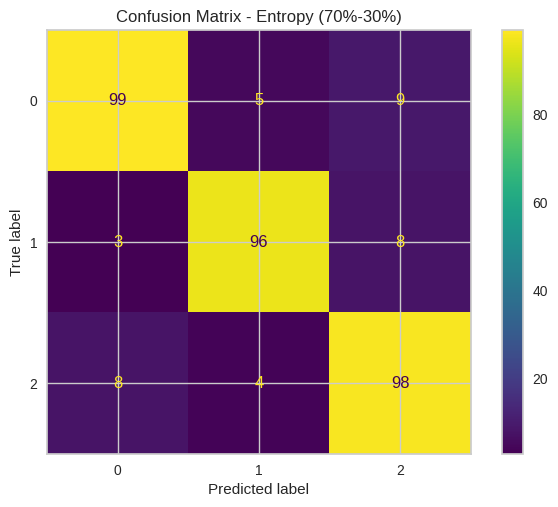


Confusion Matrix for Entropy with partition 80%-20%:


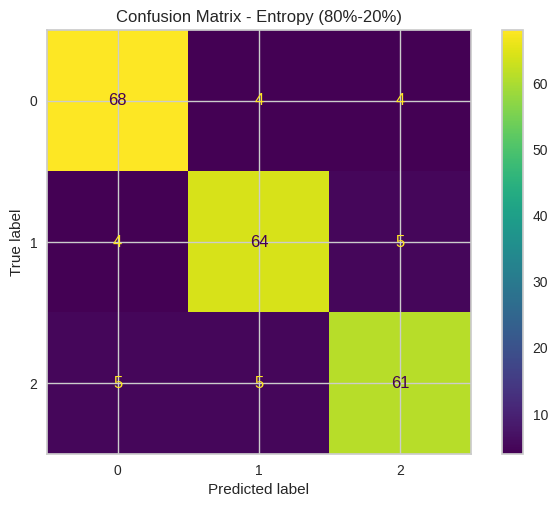


Confusion Matrix for Entropy with partition 90%-10%:


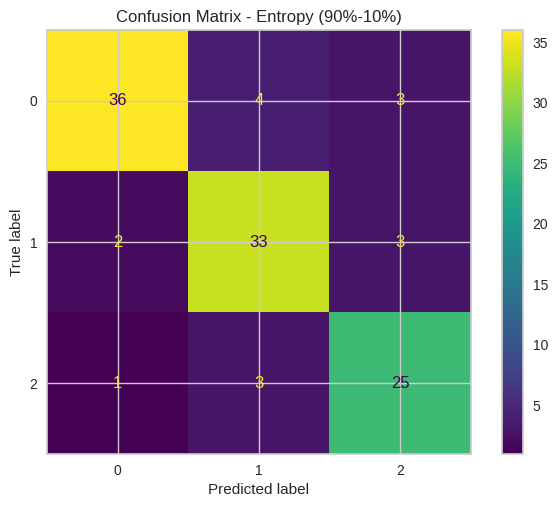

In [ ]:
unique_classes = sorted(set(y_train_70))

partitions = [
    (models["70%-30%"], X_test_30, y_test_30, "70%-30%"),
    (models["80%-20%"], X_test_20, y_test_20, "80%-20%"),
    (models["90%-10%"], X_test_10, y_test_10, "90%-10%")
]

for model, X_test, y_test, title_suffix in partitions:
    print(f"\nConfusion Matrix for Entropy with partition {title_suffix}:")
    disp = ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, display_labels=unique_classes)
    plt.title(f"Confusion Matrix - Entropy ({title_suffix})")
    plt.show()

**Decision Tree Visualization for Entropy Classifier Across Partitions**
Each tree diagram shows the splits made at each node, the conditions for those splits, and the resulting class predictions. The filled colors represent the predicted classes, providing a clear view of how the model categorizes instances. By examining the different visualizations, we can observe how the structure of the tree changes with varying amounts of training data, which can impact model complexity and interpretability.

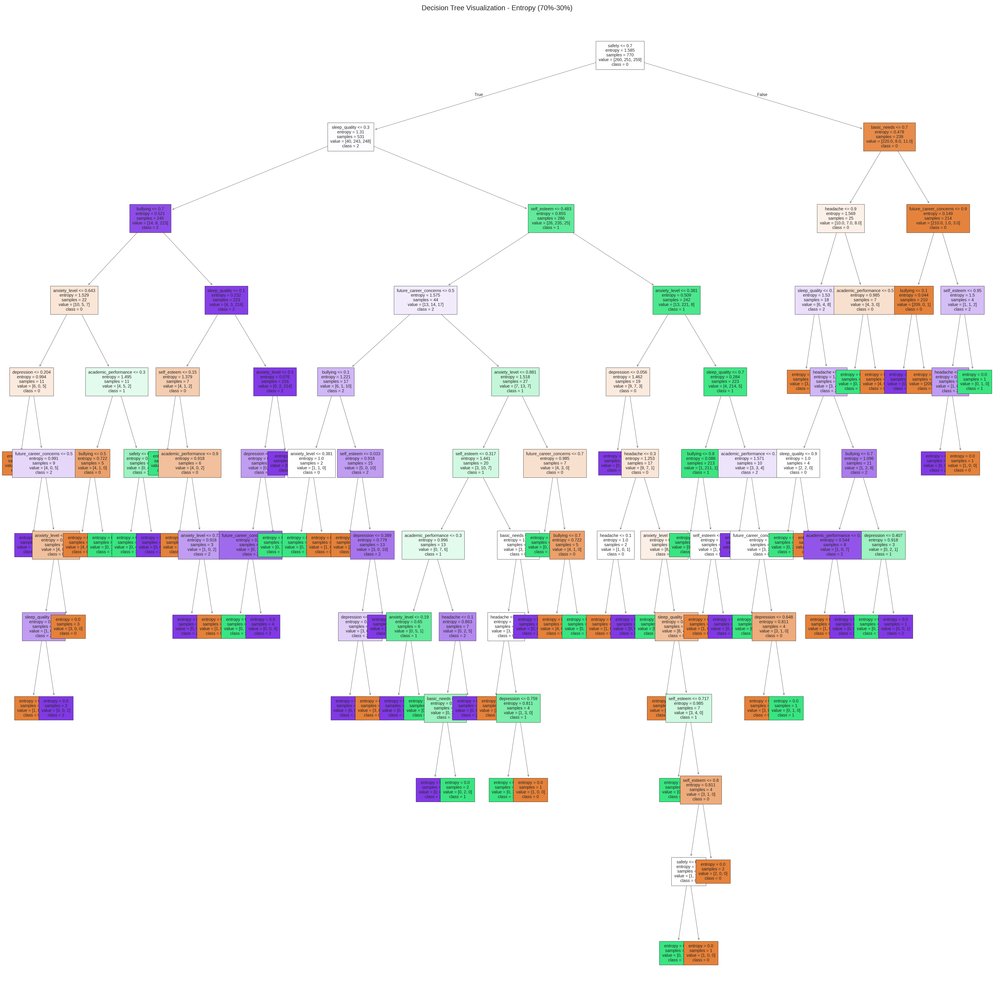

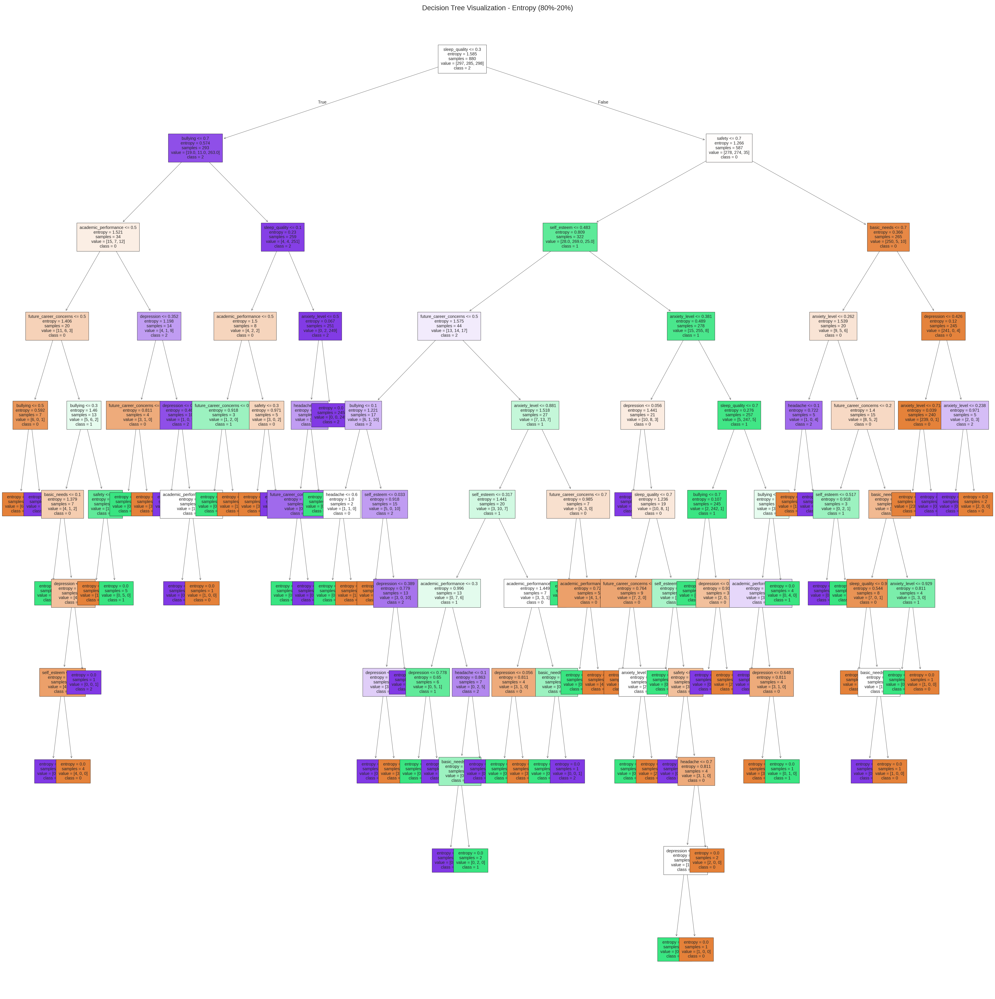

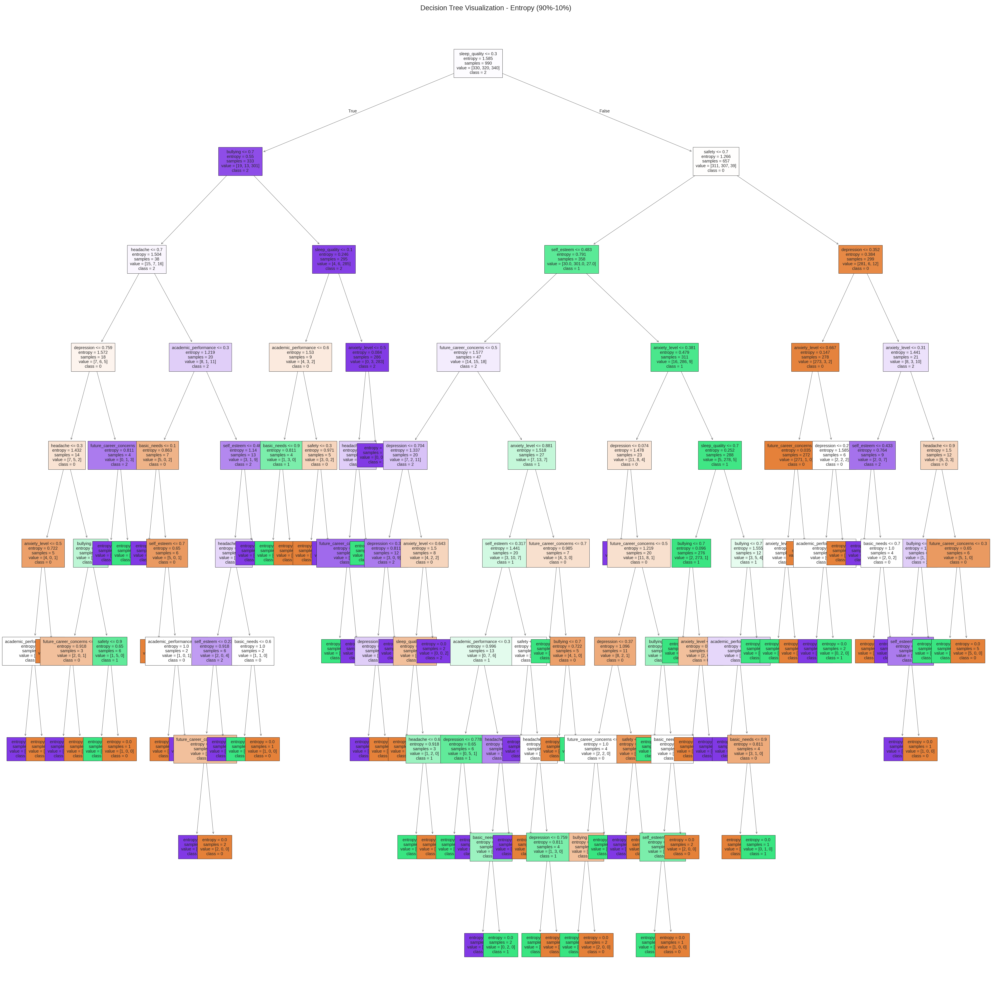

In [ ]:
unique_classes = np.unique(y_train_70)
for partition, model in models.items():
    plt.figure(figsize=(20, 20), dpi=300)
    plot_tree(model, feature_names=X.columns, class_names=unique_classes.astype(str), filled=True, fontsize=6)
    plt.title(f"Decision Tree Visualization - Entropy ({partition})", fontsize=10)
    plt.tight_layout()

    # Save the figure
    filename = f"decision_tree_entropy_{partition}.png"
    plt.savefig(filename, bbox_inches='tight', dpi=300)

    # Display the figure
    plt.show()
    plt.close()

## Gini

**Performance Evaluation of the Gini** We noticed that the Gini-based decision tree models exhibited **high test accuracy** across all partitions. For the **70%-30%** partition, the test accuracy was **87.58%**, with a sensitivity of **87.57%**. However, the specificity was **zero**, indicating that the model did not correctly classify any negative instances. In the **80%-20%** partition, the test accuracy improved to **88.18%**, and sensitivity remained high at **88.13%**, but specificity was still zero. Finally, in the **90%-10%** partition, the test accuracy decreased slightly to **87.27%**, with sensitivity dropping to **86.77%**, while specificity again remained at zero. Overall, we observed that while the models effectively identified positive instances, their inability to classify negative instances raises concerns about their performance, suggesting a need for further tuning to enhance specificity.

In [ ]:
gini_results = []
confusion_matrices = {}

models_gini = {
    "70%-30%": DecisionTreeClassifier(criterion='gini', random_state=42),
    "80%-20%": DecisionTreeClassifier(criterion='gini', random_state=42),
    "90%-10%": DecisionTreeClassifier(criterion='gini', random_state=42)
}

# Train and evaluate for each split (Gini)
for partition, model in models_gini.items():

    if partition == "70%-30%":
        X_train, X_test, y_train, y_test = X_train_70, X_test_30, y_train_70, y_test_30
    elif partition == "80%-20%":
        X_train, X_test, y_train, y_test = X_train_80, X_test_20, y_train_80, y_test_20
    elif partition == "90%-10%":
        X_train, X_test, y_train, y_test = X_train_90, X_test_10, y_train_90, y_test_10

    # Train the model
    model.fit(X_train, y_train)

    # Predictions and metrics
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)

    # Store the confusion matrix
    confusion_matrices[partition] = cm

    # Calculate metrics
    tn_sum = 0
    fp_sum = 0
    for i in range(len(cm)):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        tn_sum += tn
        fp_sum += fp

    specificity = tn_sum / (tn_sum + fp_sum) if (tn_sum + fp_sum) > 0 else 0

    results = {
        'Partition': partition,
        'Train Accuracy': accuracy_score(y_train, model.predict(X_train)),
        'Test Accuracy': accuracy_score(y_test, y_pred),
        'Sensitivity': recall_score(y_test, y_pred, average='macro'),
        'Specificity': specificity,
        'Precision': precision_score(y_test, y_pred, average='macro')
    }

    gini_results.append(results)

# Convert gini results to DataFrame and print
gini_results_df = pd.DataFrame(gini_results)
print("Gini Results:")
print(gini_results_df[['Partition','Test Accuracy', 'Sensitivity', 'Specificity', 'Precision']])

Gini Results:
  Partition  Test Accuracy  Sensitivity  Specificity  Precision
0   70%-30%       0.875758     0.875699     0.937879   0.876147
1   80%-20%       0.881818     0.881254     0.940909   0.882655
2   90%-10%       0.872727     0.867661     0.936364   0.870643


 **Confusion matrices for the Gini index model** with varying splits, we observe a trend where increasing the test size slightly reduces accuracy. For the 90%-10% split, Class 0 achieved **39/43 correct** predictions, Class 1 had **33/38 correct**, and Class 2 had **24/29 correct**, showing minimal misclassification. With the 80%-20% split, Class 0 had **69/76 correct**, Class 1 had **64/73 correct**, and Class 2 had **61/71 correct** , indicating more overlap, especially between Classes 1 and 2. In the 70%-30% split, misclassifications increased further, with Class 0 at **100/113 correct**, Class 1 at **94/107**, and Class 2 at **95/110.** Overall, the 90%-10% split performed best, with increasing test sizes leading to slightly higher misclassification rates.

* classes is the blue blocks*

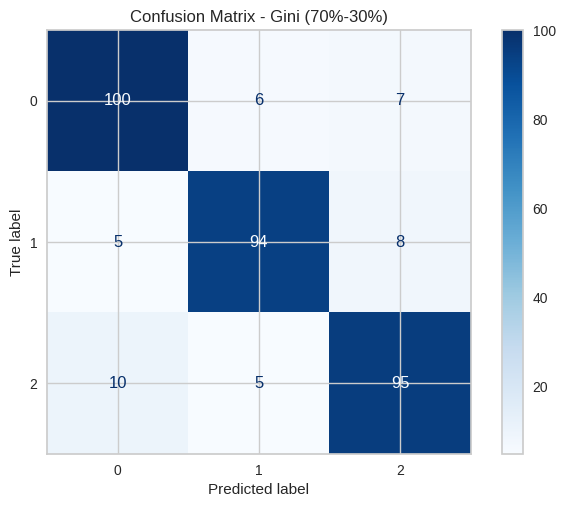

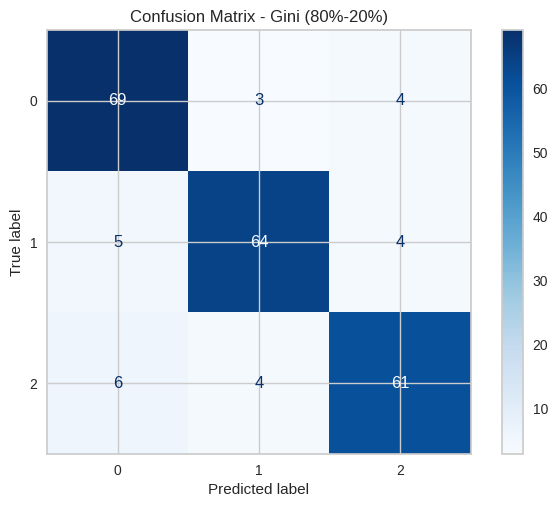

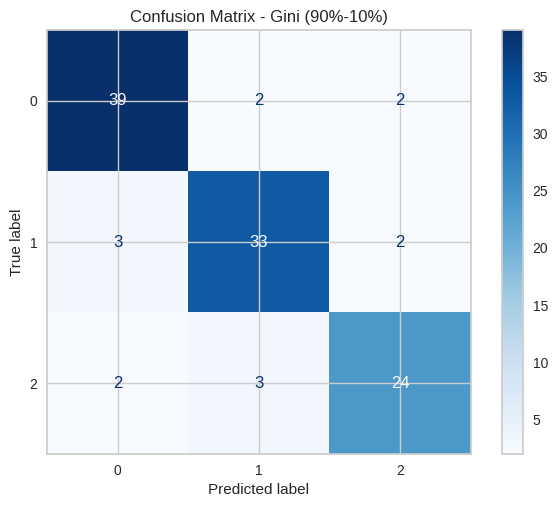

In [ ]:
def display_confusion_matrices(confusion_matrices, models):
    for partition, cm in confusion_matrices.items():
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=models[partition].classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"Confusion Matrix - Gini ({partition})")
        plt.show()

display_confusion_matrices(confusion_matrices, models_gini)

**Decision Tree Visualization for Gini Classifier Across Partitions**
We noticed in the 70%-30% Partition
The decision tree **is the most complex**, with a deeper hierarchy and more nodes.
that means that the model had to learn intricate patterns in the data to achieve good performance.

 in the 80%-20% Partition
The decision tree structure is also complex, **but less so than the 70%-30%** partition.
The leaf node distribution indicates the model is able to effectively separate the classes.

with the last partition 90%-10%
The decision tree **is the simplest**, with a shallower structure and fewer nodes.

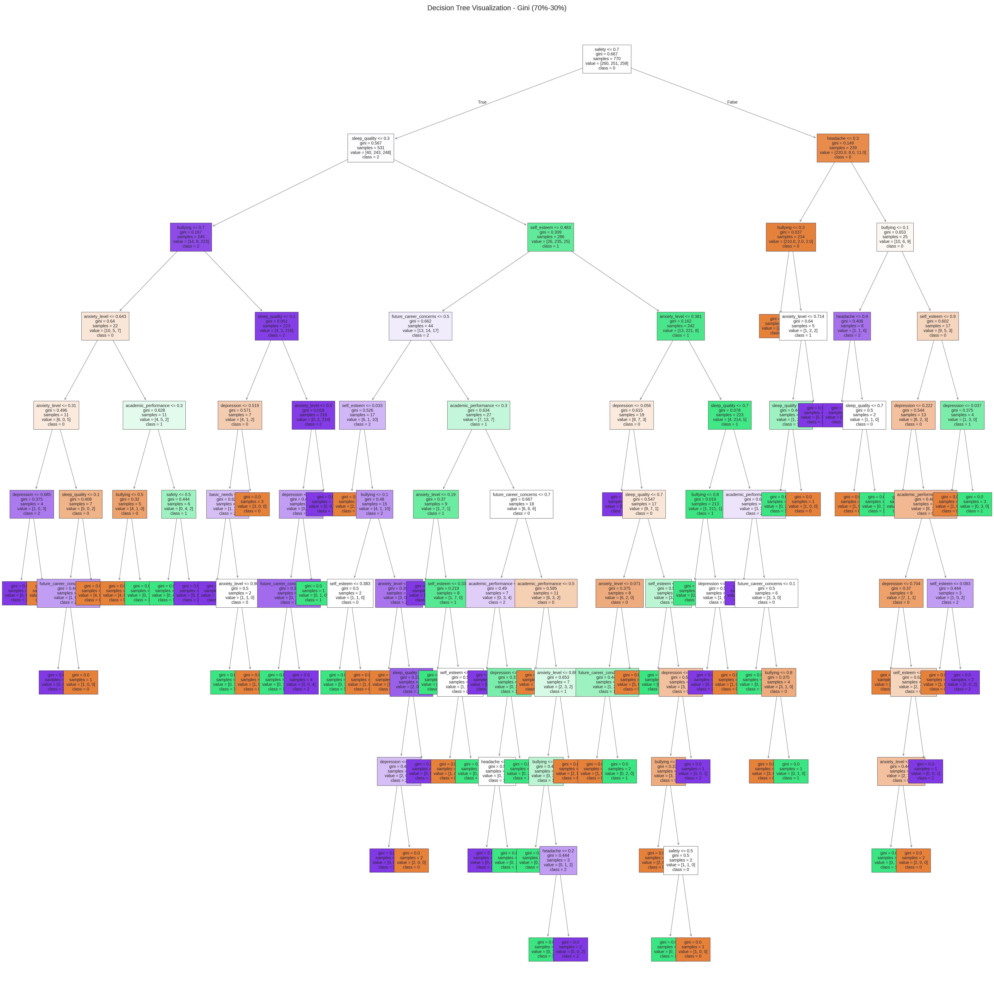

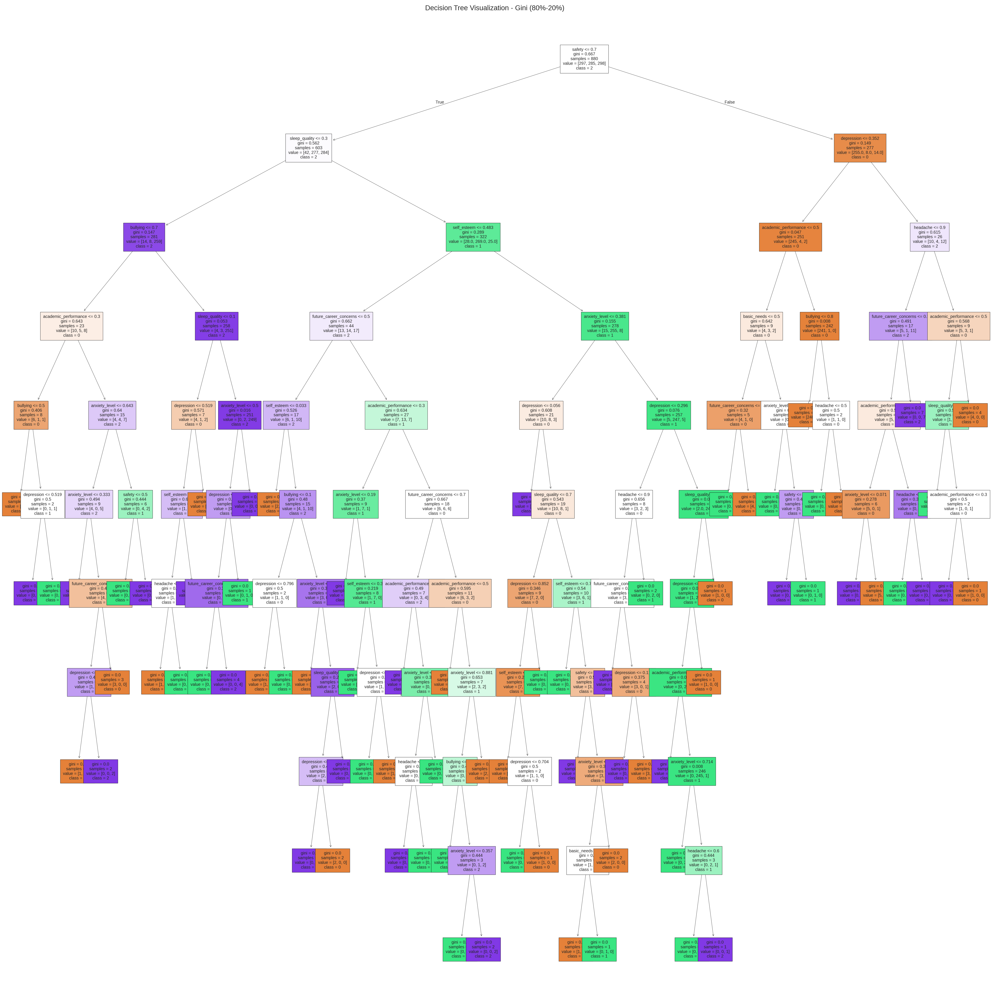

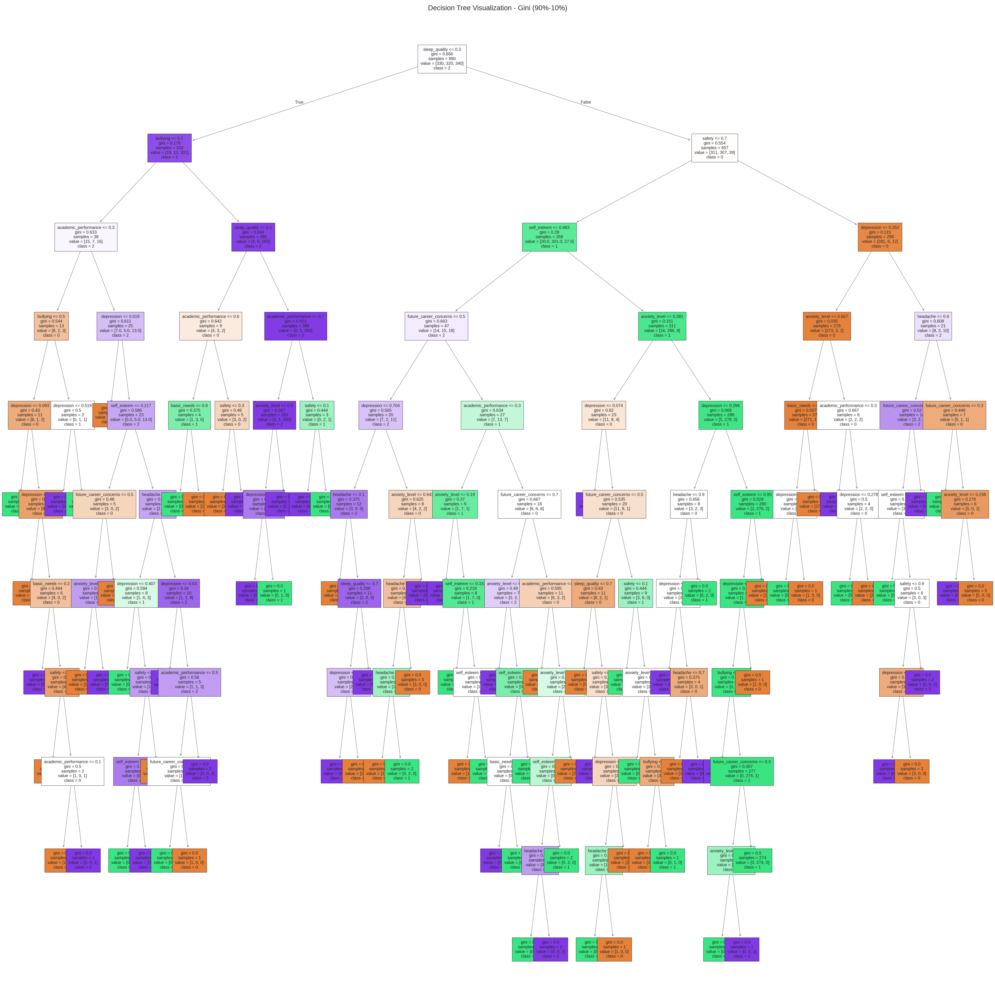

In [ ]:
def visualize_gini_decision_trees(models_gini, X, unique_classes):
    for partition, model in models_gini.items():
        plt.figure(figsize=(20, 20), dpi=300)
        plot_tree(model,
                  feature_names=X.columns,
                  class_names=unique_classes.astype(str),
                  filled=True,
                  fontsize=6)
        plt.title(f"Decision Tree Visualization - Gini ({partition})", fontsize=10)
        plt.tight_layout()
        plt.show()

visualize_gini_decision_trees(models_gini, X_train_70, unique_classes)


## Comparing Results (GINI - ENTROPY)

Our analysis highlights key differences in performance across partition sizes, also across the two criterias providing insight into the optimal split for our dataset with the best criteria.

 When examining test accuracy, we observe that the **80%-20% partition yields the highest accuracy for Gini** (approximately **88.18%**), while the **70%-30% partition yields the highest accuracy for Entropy** (approximately **88.79%**). The **90%-10% partition shows the lowest test accuracy for both criteria**, with Gini around **87.27%** and Entropy around **85.45%**. This trend suggests that the **80%-20% partition is optimal for Gini**, while the **70%-30% partition is optimal for Entropy**, as both provide a good balance between training data volume and test data reliability.

Sensitivity shows how well the model correctly identifies positive cases. **The 80%-20% split does the best here with 88.13%**, meaning it’s slightly better at detecting the right positives. **The 70%-30% split comes next at 87.57%**, still doing a good job of finding positives even with more test data. **The 90%-10% split has the lowest sensitivity at 86.77%**, likely because the smaller test set gives fewer chances to catch positives. All splits show strong sensitivity, but **80%-20% leads by a small margin**.

Specificity measures how well the model correctly identifies negatives, or avoids false alarms. **The 80%-20% split has the best specificity at 94.09%**, showing it’s very good at spotting negatives. **The 70%-30% split is almost as good at 93.79%**, even with a larger test set. **The 90%-10% split has the lowest specificity at 93.64%**, likely because of overfitting to the training data. While all splits perform well, **a balanced test size like 80%-20% helps maintain high specificity**.

Precision tells us how accurate the model’s positive predictions are. **The 80%-20% split has the highest precision at 88.27%**, meaning it makes fewer mistakes when predicting positives. **The 70%-30% split follows closely at 87.61%**, showing the model stays reliable even with a bigger test set. **The 90%-10% split has the lowest precision at 87.06%**, likely due to having less variety in the smaller test set. Overall, all splits show high precision, but **the 80%-20% split performs best**.

In comparing Gini and Entropy, **both criteria yield similar accuracy** across partitions, making either suitable. However, given that Gini performs best with the **80%-20% partition** and Entropy performs best with the **70%-30% partition**, these splits are likely optimal for their respective criteria.


---


The **80%-20% partition** for Gini and the **70%-30% partition** for Entropy provide sufficient training data while preserving enough test data to effectively evaluate the models' generalization, thereby reducing overfitting risks and maximizing accuracy.

##Clustring

---
In our analysis, we employed the K-means clustering algorithm to explore the structure of our dataset. This technique is widely used for partitioning data into distinct groups based on similarity, making it ideal for identifying patterns within our data. We specifically chose to evaluate the clustering performance for **K values of 2, 3, and 4**, as these configurations allow us to assess the balance between simplicity and meaningful separation. By examining these three options, we can observe how the **within-cluster sum of squares (WCSS)** and **silhouette** scores change, helping us identify the optimal number of clusters for effectively capturing the underlying structure while avoiding overfitting. This focused approach provides a clear understanding of how well our data points are grouped based on varying cluster configurations.

## Scaled Resault


---


The scaled values for `self-esteem `range from negative to positive, indicating variability among participants. For instance, a participant with a score of **1.14** suggests significantly higher `self-esteem` compared to the mean, while another participant with a **-1.09** indicates lower `self-esteem`. The `bullying` feature also shows a wide range of values, with some individuals reporting experiences that are well above the average (positive values), while others report significantly less (negative values). This disparity highlights the need for targeted interventions for those affected by bullying.

In terms of `sleep quality,` the negative values suggest that many participants are experiencing poorer sleep relative to the average, which could be a critical area for further investigation as it relates to mental health. The variation in scores for `future_career_concerns` indicates differing levels of anxiety regarding career prospects; some participants display heightened concerns (positive scores), while others feel more secure (negative scores).

The scaled scores for `anxiety and depression` show that many individuals are grappling with these issues, as indicated by both positive and negative values. This suggests a significant portion of the population might require support in these areas. Similarly, the `academic_performance` scores vary, with some students performing above average and others below, indicating a need for targeted academic support initiatives. The scores for `headache and safety ` further illustrate the diverse experiences among participants, suggesting that these factors also impact overall well-being.

Overall, the analysis indicates substantial variability in participant responses across all features, suggesting that our dataset captures a wide range of experiences and challenges faced by individuals. Moving forward,

In [ ]:
features = ds2.drop('stress_level', axis=1)

# Scale the features to have mean=0 and variance=1
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Create a DataFrame with scaled features for easier handling
scaled_stress_levels = pd.DataFrame(scaled_features, columns=features.columns)
print("\nScaled DataFrame:")
print(scaled_stress_levels.head())


Scaled DataFrame:
   self_esteem  bullying  sleep_quality  future_career_concerns  \
0     0.248612 -0.403377      -0.426445                0.229550   
1    -1.093590  1.557071      -1.072574                1.537869   
2     0.024912 -0.403377      -0.426445               -0.424609   
3    -0.646189  1.557071      -1.072574                0.883709   
4     1.143414  1.557071       1.511942               -0.424609   

   anxiety_level  depression  academic_performance  headache    safety  \
0       0.480208   -0.201393              0.160736 -0.360741  0.186924   
1       0.643746    0.316508             -1.253741  1.768859 -0.524551   
2       0.153131    0.187033             -0.546502 -0.360741  0.186924   
3       0.807284    0.316508             -0.546502  1.058992 -0.524551   
4       0.807284   -0.719293              0.867974 -0.360741  0.898398   

   basic_needs  
0    -0.539196  
1    -0.539196  
2    -0.539196  
3    -0.539196  
4     0.158587  


##  K-Means Clustering Analysis Results


---
In our analysis using K-means clustering, we explored various cluster configurations (K values) to understand how well our features group together. The results, including the cluster centers, labels, and silhouette scores for K values of **2**, **3**, and **4**, provide valuable insights into the underlying structure of our dataset. For **K=2**, the cluster centers indicate a division between two distinct groups. The first cluster center shows a balance of positive and negative values across features, suggesting moderate levels of self-esteem, anxiety, and depression. In contrast, the second cluster center reflects a more extreme profile, indicating a group potentially facing significant challenges. At **K=3**, the additional cluster introduces finer distinctions, with one center indicating individuals experiencing moderate levels across most features, while the other two highlight groups with either high concerns (anxiety and depression) or significantly lower scores. For **K=4**, the complexity increases further, revealing four distinct clusters that allow for deeper insights into participant experiences and broader mental health profiles.

Overall, our clustering analysis has revealed meaningful patterns within the dataset, demonstrating the effectiveness of K-means clustering in uncovering latent structures among participants. The results suggest a diverse range of experiences regarding mental health and academic performance, necessitating tailored interventions. Moving forward, we recommend further analyses, such as examining inter-cluster relationships or applying additional clustering methods for comparison, while also addressing the warning regarding feature names to ensure the reliability of future analyses. This clustering analysis has thus provided a solid foundation for understanding the complexities within our dataset, guiding future research directions and potential interventions.


In [ ]:
# Set a random seed for reproducibility
np.random.seed(42)

# Initialize lists to hold the inertia values and silhouette scores
inertia_values = []
silhouette_scores = []

# Set a range of K values for clustering
k_values = [2, 3, 4]

# Iterate over the defined K values
for k in k_values:
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans_result = kmeans.fit(scaled_stress_levels)

    # Store the inertia (total within-cluster sum of squares)
    inertia_values.append(kmeans.inertia_)

    # print cluster centers
    print(f"\nCluster Centers for K={k}:")
    print(kmeans_result.cluster_centers_)


Cluster Centers for K=2:
[[-0.4308701   0.43247304 -0.47569785  0.44084208  0.45548692  0.43009108
  -0.48985016  0.43900511 -0.4932973  -0.48871077]
 [ 1.02298607 -1.02679182  1.1294176  -1.04666187 -1.08143213 -1.02113649
   1.16301848 -1.04230047  1.1712028   1.16031331]]

Cluster Centers for K=3:
[[ 0.0652163  -0.09683935 -0.04896252 -0.12333289 -0.02261133 -0.0768867
  -0.18458933  0.00705739 -0.2287351  -0.21039007]
 [-1.1011843   1.13755162 -1.03468382  1.19665597  1.09852379  1.12572678
  -0.87829314  0.98888175 -0.83856565 -0.85362975]
 [ 1.06253183 -1.05260283  1.16677844 -1.07450621 -1.12481106 -1.0706046
   1.20892304 -1.05442215  1.2344366   1.22230939]]

Cluster Centers for K=4:
[[-0.99160851 -0.92231946  0.53324644  0.12373052 -0.24849946  0.34506834
   0.16073598  0.26561162  0.02998085 -0.71364231]
 [ 0.22064987  0.03548144 -0.14138822 -0.14562911  0.02085769 -0.13475099
  -0.23101857 -0.01624722 -0.2594916  -0.14412776]
 [ 1.07104007 -1.05472449  1.16565046 -1.080905

**Cluster Label Results:**
**K=2:** The data is divided into two clusters, with Cluster 0 being the dominant group and Cluster 1 representing a smaller minority. There’s an imbalance in the cluster sizes.
**K=3:** The data is split into three more balanced clusters (0, 1, 2), indicating that the clustering is now more evenly distributed, capturing more nuanced patterns in the data.
**K=4:** The data is further divided into four clusters, suggesting a finer partitioning of the data. However, Cluster 3 contains a larger portion of the data points, indicating some imbalance, though the clustering is more detailed and captures more complexity.

In [ ]:
# Iterate over the defined K values
for k in k_values:
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans_result = kmeans.fit(scaled_stress_levels)
    print(f"\nCluster Labels for K={k}:")
    print(kmeans_result.labels_)


Cluster Labels for K=2:
[0 0 0 ... 1 0 0]

Cluster Labels for K=3:
[0 1 0 ... 2 1 1]

Cluster Labels for K=4:
[1 3 1 ... 2 3 3]


**Silhouette Score Visualization:**
K = 2 (Score: 0.458178):
The score suggests moderate clustering quality. The two clusters are somewhat separated but not well-defined, indicating some overlap and limited separation.
K = 3 (Score: 0.465644):
A slight improvement in clustering. The three clusters are better separated, though there may still be minor overlap or cohesion issues. It suggests a more accurate partition compared to k=2.
K = 4 (Score: 0.472138):
The best clustering quality with the highest score. The four clusters are well-separated with clear boundaries, indicating optimal performance and better capture of data patterns.

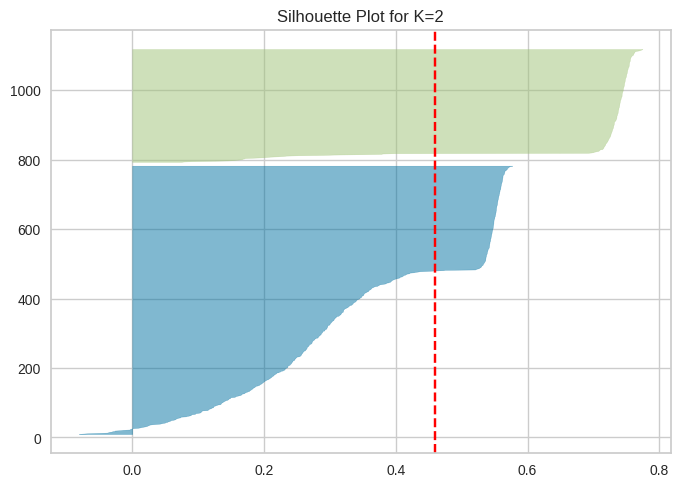

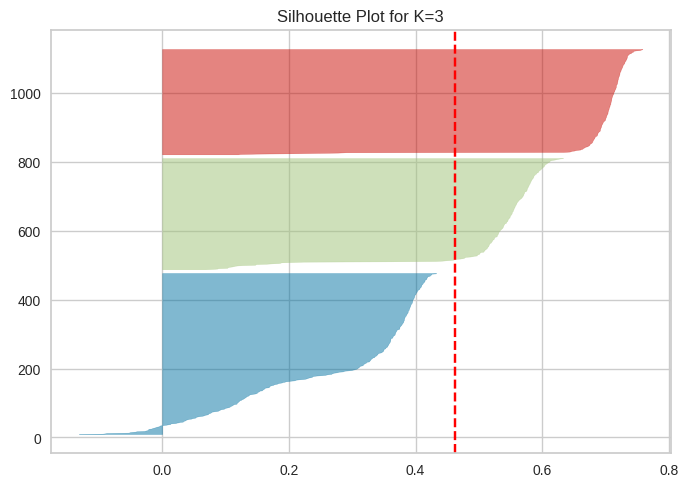

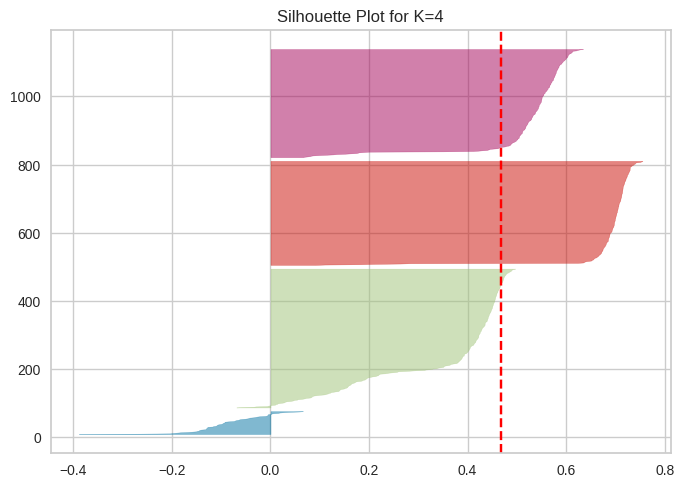

In [ ]:

for k in k_values:
    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=k, random_state=42)

    kmeans.fit(scaled_features)
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')

    visualizer.fit(scaled_features)

    # Show the plot
    plt.title(f'Silhouette Plot for K={k}')
    plt.show()

## K-Means Clustering Visualization


---
When we look at the "Elbow Method (WCSS vs. K)" plot, we noticed a clear elbow or inflection point around **K=3 and K=4.** This suggests that those values for the number of clusters may be the optimal choices for our data. The within-cluster sum of squares (WCSS) starts to level off after those points, indicating that increasing the number of clusters beyond **3 or 4** doesn't significantly improve the model fit.

Complementing this, the "Silhouette Score vs. K" plot shows that the average silhouette score, which measures how well each data point fits into its assigned cluster, continues to rise as we increase the number of clusters. However, the rate of increase starts to slow down around **K=4**, hinting that this may be the sweet spot where the clustering quality is maximized.

By considering both the elbow method and the silhouette score, it seems like **K=3 or K=4** are the most reasonable options for the number of clusters in our dataset. The elbow plot points to those values as potential "elbows," while the silhouette score plot confirms that the clustering performance is best when using 4 clusters.


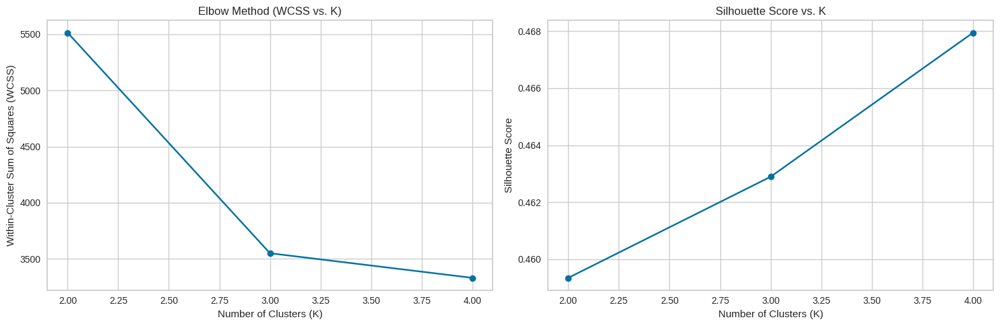

In [ ]:
# Create a DataFrame to store clustering results for plotting
clustering_results = pd.DataFrame({
    'K': k_values,
    'Within-Cluster Sum of Squares (WCSS)': inertia_values,
    'Silhouette Score': silhouette_scores
})

# Plotting the Elbow and Silhouette Score results
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Plot the Elbow Method (WCSS vs. K)
ax[0].plot(clustering_results['K'], clustering_results['Within-Cluster Sum of Squares (WCSS)'], marker='o')
ax[0].set_title("Elbow Method (WCSS vs. K)")
ax[0].set_xlabel("Number of Clusters (K)")
ax[0].set_ylabel("Within-Cluster Sum of Squares (WCSS)")

# Plot the Silhouette Scores
ax[1].plot(clustering_results['K'], clustering_results['Silhouette Score'], marker='o')
ax[1].set_title("Silhouette Score vs. K")
ax[1].set_xlabel("Number of Clusters (K)")
ax[1].set_ylabel("Silhouette Score")

plt.tight_layout()
print("\n")
plt.show()

## Avarges results for both techniques

---


When we start with **2 clusters** , we notice the within-cluster sum of squares (WCSS) is quite high at **474.727439**. This indicates there's still a fair amount of variation within the clusters, suggesting the data may not be best represented by just two groups. However, the silhouette score of **0.458178** tells us the clustering is still reasonably well-defined, even with this lower number of clusters.

As we increase the number of clusters to **3**, we see the WCSS drop significantly to **302.949820**. This implies that adding that extra cluster helps to better capture the nuances in our data, reducing the overall intra-cluster variation. Correspondingly, the silhouette score also goes up to **0.465644**, hinting that the data points are fitting more cleanly into their assigned clusters.

Moving to **4 clusters**, the WCSS decreases further to **283.424175**, and the silhouette score reaches its highest value of **0.472138**. This suggests that the **4-cluster** configuration may be an optimal balance, where we're able to represent the dataset well without over-fitting by adding too many clusters.

The trend we're observing here is quite typical for K-means – as we increase the number of clusters, the model is able to capture more of the underlying structure in the data, resulting in lower WCSS and higher silhouette scores. But the rate of improvement starts to diminish beyond a certain point, in this case around **K=4,** hinting that this may be the sweet spot for our particular dataset.

These results give us a solid foundation to further explore the clustering patterns and make informed decisions about the appropriate number of groups to focus on for our analyses going forward. The insights gleaned from these metrics will be invaluable as we dive deeper into understanding the complexities within our dataset.




In [ ]:
clustering_results = {'K': [], 'Within-Cluster Sum of Squares (WCSS)': [], 'Silhouette Score': []}

# Iterate over each K value
for k in k_values:
    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)

    # Calculate WCSS (within-cluster sum of squares)
    wcss = kmeans.inertia_

    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, kmeans.labels_)

    # Store results
    clustering_results['K'].append(k)
    clustering_results['Within-Cluster Sum of Squares (WCSS)'].append(wcss)
    clustering_results['Silhouette Score'].append(silhouette_avg)
clustering_results_df = pd.DataFrame(clustering_results)

print("K-Means Clustering Results:")
print(clustering_results_df)

K-Means Clustering Results:
   K  Within-Cluster Sum of Squares (WCSS)  Silhouette Score
0  2                            474.727439          0.458178
1  3                            302.949820          0.465644
2  4                            283.424175          0.472138
